## Annotation

In this notebook I will determine the intervals of slices that feature erosion. These intervals were hadpicked with the help of Andrei Anisimov, who had gathered this data in the first place.

File configuration

In [1]:
# Adjust the frac parameter for loess smoothing
# to control the degree of smoothing applied to the scan data.
slices_dir = "../scandata/cnn_slices loess frac=0.20"

Annotations for the erosion:

In [2]:
annotations = {
    '221111_144114__binary_onlylines145900to148050': {
        (280, 560): 3,
        (590, 640): 2,
        (660, 700): 2,
        (740, 810): 2,
        (960, 1010): 2,
        (1140, 1200): 2,
        (1230, 1280): 2,
        (1380, 1400): 2,
        (1450, 1470): 2,
    },
    '221111_144114__binary_onlylines25660to28100': {
        (200, 530): 3,
        (590, 660): 2,
        (680, 740): 2,
        (790, 880): 2,
        (1080, 1110): 2,
        (1270, 1330): 2,
        (1380, 1430): 2,
        (1560, 1580): 2,
        (1660, 1700): 2,
    },
    '221111_144114__binary_onlylines47178to50517': {
        (2550, 3060): 3,
        (2400, 2480): 2,
        (2350, 2370): 2,
        (2270, 2300): 2,
        (1860, 1900): 2,
        (1540, 1620): 2,
        (1400, 1450): 2,
        (1170, 1200): 2,
        (1070, 1100): 2,
    },
    '221111_144114__binary_onlylines86841to90142': {
        (240, 640): 3,
        (730, 800): 2,
        (840, 910): 2,
        (950, 1080): 2,
        (1340, 1420): 2,
        (1670, 1740): 2,
        (1820, 1890): 2,
        (2130, 2170): 2,
        (2240, 2270): 2,
    },
    '221111_144114__binary_onlylines114378to117271': {
        (2130, 2630): 3,
        (1920, 2010): 2,
        (1790, 1890): 2,
        (1610, 1750): 2,
        (1310, 1380): 2,
        (1110, 1160): 2,
        (1010, 1050): 2,
        (860, 890): 2,
        (770, 800): 2,
    }
}

Libraries used:

In [3]:
import matplotlib.pyplot as plt
import numpy as np
import glob

import os
import open3d as o3d

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


# Helper functions

A function for rendering an anotation of erosion onto a scatter plot

In [4]:
def annotation_line(ax, xmin, xmax, y, text, ytext = 0, linecolor = 'red', linewidth = 1, fontsize = 12):
    ax.annotate('',
                xy=(xmin, y),
                xytext=(xmax, y),
                xycoords='data',
                textcoords='data',
                arrowprops={'arrowstyle': '|-|',
                            'color': linecolor, 
                            'linewidth':linewidth
                           }
               )
    
    ax.annotate('', 
                xy=(xmin, y), 
                xytext=(xmax, y), 
                xycoords='data', 
                textcoords='data',
                arrowprops={'arrowstyle': '<->', 
                            'color': linecolor, 
                            'linewidth':linewidth
                           }
               )

    xcenter = xmin + (xmax - xmin) / 2

    ax.annotate(text, xy=(xcenter,ytext), ha='center', va='center', fontsize=fontsize, color='white')

Let's load the pointclouds where we can see the erosion (difference between smoothed and original).

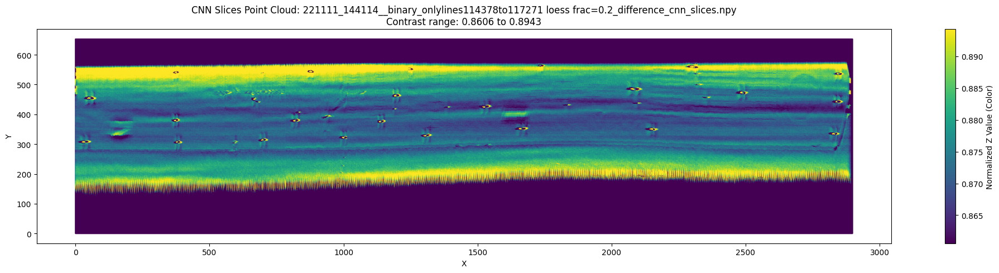

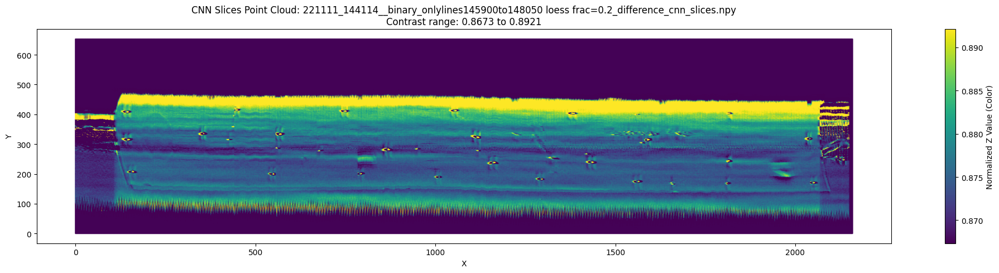

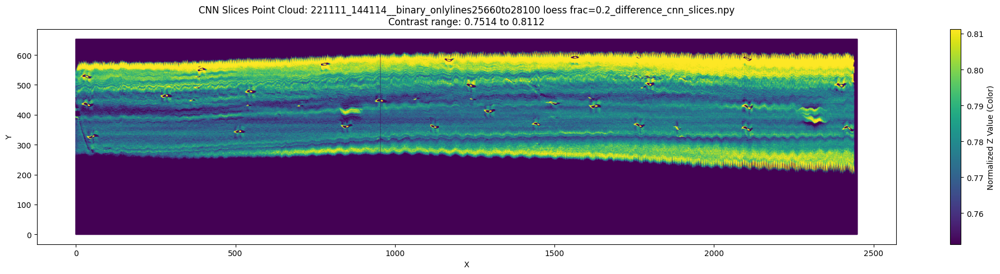

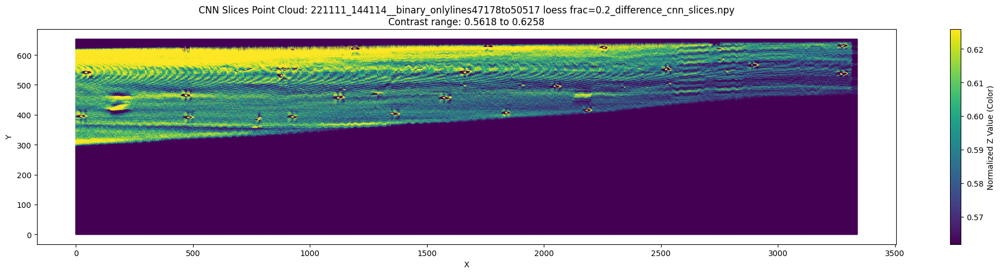

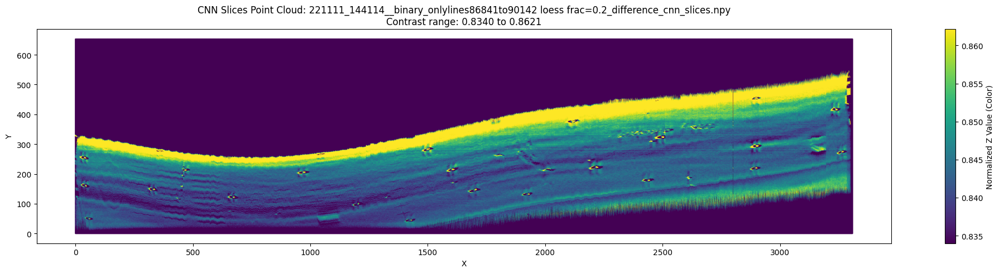

In [5]:
# Let's load the CNN slices where we can see the erosion (difference between smoothed and original).
cnn_files = [f for f in os.listdir(slices_dir) if f.endswith("_cnn_slices.npy")]

for cnn_file in cnn_files:
    cnn_path = os.path.join(slices_dir, cnn_file)
    cnn_slices = np.load(cnn_path)  # shape: (num_slices, height, width)
    
    # Convert CNN slices back to point cloud format for visualization
    all_x = []
    all_y = []
    all_z = []
    
    slice_width = 10  # Same as used in slicing_for_cnn
    
    for slice_idx, image in enumerate(cnn_slices):
        start_x = slice_idx * slice_width  # Calculate start position from slice index
        
        # Find non-zero pixels
        y_coords, x_coords = np.where(image != 0)
        z_values = image[y_coords, x_coords]
        
        # Convert pixel coordinates back to actual coordinates
        actual_x = x_coords + start_x
        actual_y = y_coords  # Y coordinates are already in pixel space
        
        if len(z_values) > 0:
            all_x.extend(actual_x)
            all_y.extend(actual_y)
            all_z.extend(z_values)
    
    if len(all_x) > 0:
        # Calculate unique vmin/vmax for this point cloud to maximize contrast
        z_array = np.array(all_z)
        z_min = np.percentile(z_array, 5)   # Use 5th percentile to avoid extreme outliers
        z_max = np.percentile(z_array, 95)  # Use 95th percentile to avoid extreme outliers
        
        plt.figure(figsize=(20, 5))
        sc = plt.scatter(all_x, all_y, c=all_z, s=0.1, vmin=z_min, vmax=z_max, cmap='viridis')
        plt.title(f"CNN Slices Point Cloud: {cnn_file}\nContrast range: {z_min:.4f} to {z_max:.4f}")
        plt.xlabel("X")
        plt.ylabel("Y")
        cbar = plt.colorbar(sc)
        cbar.set_label("Normalized Z Value (Color)")
        plt.tight_layout()
        plt.show()

Now, let's assign each slice its annotation.

In [6]:
# Create a labeled copy of each CNN slices file
labeled_dir = slices_dir.rstrip("/") + "_labeled"
os.makedirs(labeled_dir, exist_ok=True)

for cnn_file in cnn_files:
    # Extract the base name to match with annotations
    base_name = cnn_file.replace("_cnn_slices.npy", "")
    # Find the annotation key that matches the base name
    annotation_key = None
    for key in annotations:
        if key in base_name:
            annotation_key = key
            break

    cnn_path = os.path.join(slices_dir, cnn_file)
    cnn_slices = np.load(cnn_path)  # shape: (num_slices, height, width)
    num_slices = cnn_slices.shape[0]
    
    slice_width = 10  # Same as used in slicing_for_cnn
    
    # Calculate slice start positions based on slice index
    slice_starts = [i * slice_width for i in range(num_slices)]

    # Assign labels based on slice start positions
    labels = np.zeros(num_slices, dtype=int)
    if annotation_key is not None:
        for (xmin, xmax), label in annotations[annotation_key].items():
            for i, start_x in enumerate(slice_starts):
                if xmin <= start_x < xmax:
                    labels[i] = label

    # Save labeled CNN slices
    outname = cnn_file.replace("_cnn_slices.npy", "_cnn_slices_labeled.npy")
    outpath = os.path.join(labeled_dir, outname)
    np.save(outpath, {"slices": cnn_slices, "labels": labels})
    print(f"Saved labeled CNN slices: {outpath}")
    print(f"  Shape: {cnn_slices.shape}")
    print(f"  Labels: {len(labels)} slices labeled")
    print(f"  Label distribution: {np.bincount(labels)}")


Saved labeled CNN slices: ../scandata/cnn_slices loess frac=0.20_labeled/221111_144114__binary_onlylines114378to117271 loess frac=0.2_difference_cnn_slices_labeled.npy
  Shape: (290, 654, 10)
  Labels: 290 slices labeled
  Label distribution: [185   0  55  50]
Saved labeled CNN slices: ../scandata/cnn_slices loess frac=0.20_labeled/221111_144114__binary_onlylines145900to148050 loess frac=0.2_difference_cnn_slices_labeled.npy
  Shape: (216, 654, 10)
  Labels: 216 slices labeled
  Label distribution: [152   0  36  28]
Saved labeled CNN slices: ../scandata/cnn_slices loess frac=0.20_labeled/221111_144114__binary_onlylines25660to28100 loess frac=0.2_difference_cnn_slices_labeled.npy
  Shape: (245, 654, 10)
  Labels: 245 slices labeled
  Label distribution: [170   0  42  33]
Saved labeled CNN slices: ../scandata/cnn_slices loess frac=0.20_labeled/221111_144114__binary_onlylines47178to50517 loess frac=0.2_difference_cnn_slices_labeled.npy
  Shape: (334, 654, 10)
  Labels: 334 slices labeled


Let's render what we saved to confirm that the labels are in place.

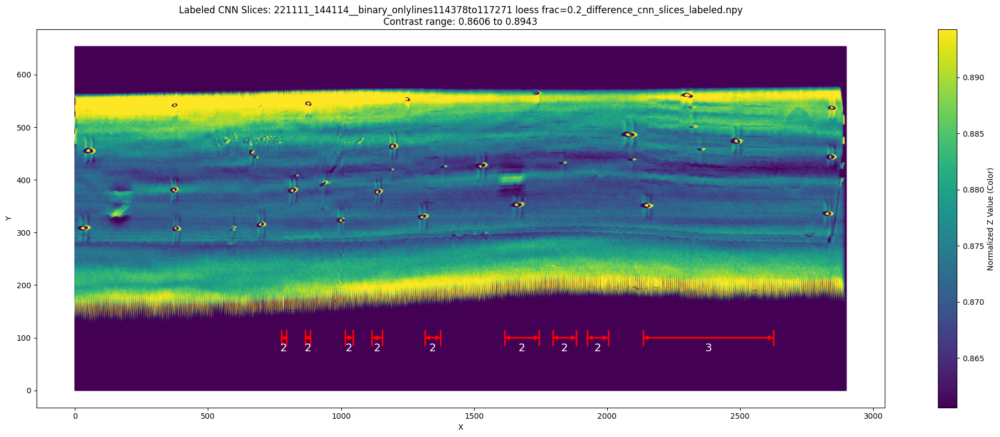

Label distribution for 221111_144114__binary_onlylines114378to117271 loess frac=0.2_difference_cnn_slices_labeled.npy:
  Label 0: 185 slices
  Label 2: 55 slices
  Label 3: 50 slices


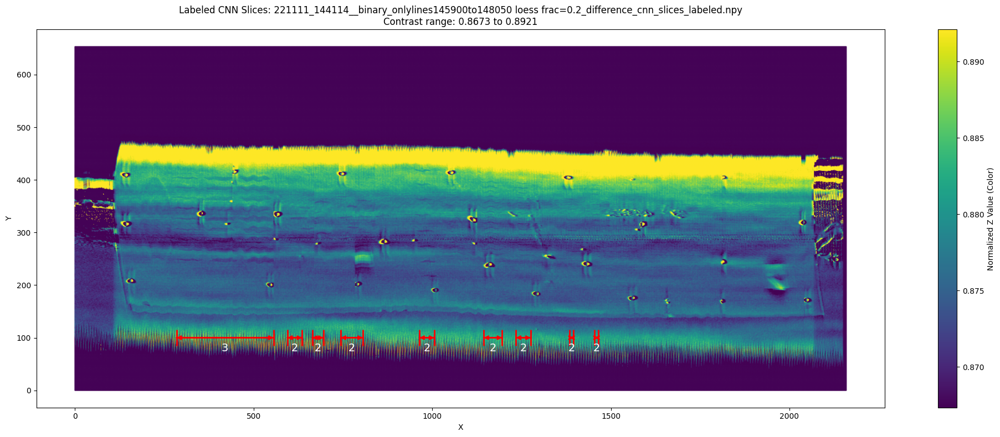

Label distribution for 221111_144114__binary_onlylines145900to148050 loess frac=0.2_difference_cnn_slices_labeled.npy:
  Label 0: 152 slices
  Label 2: 36 slices
  Label 3: 28 slices


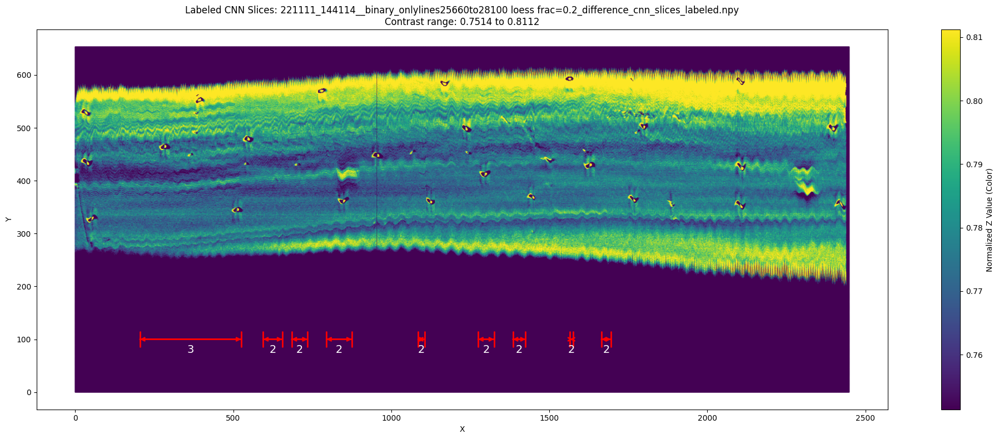

Label distribution for 221111_144114__binary_onlylines25660to28100 loess frac=0.2_difference_cnn_slices_labeled.npy:
  Label 0: 170 slices
  Label 2: 42 slices
  Label 3: 33 slices


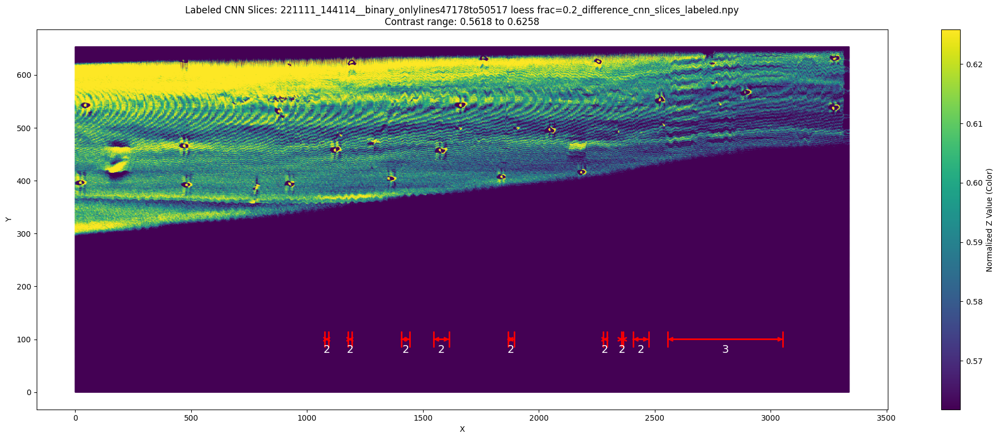

Label distribution for 221111_144114__binary_onlylines47178to50517 loess frac=0.2_difference_cnn_slices_labeled.npy:
  Label 0: 247 slices
  Label 2: 36 slices
  Label 3: 51 slices


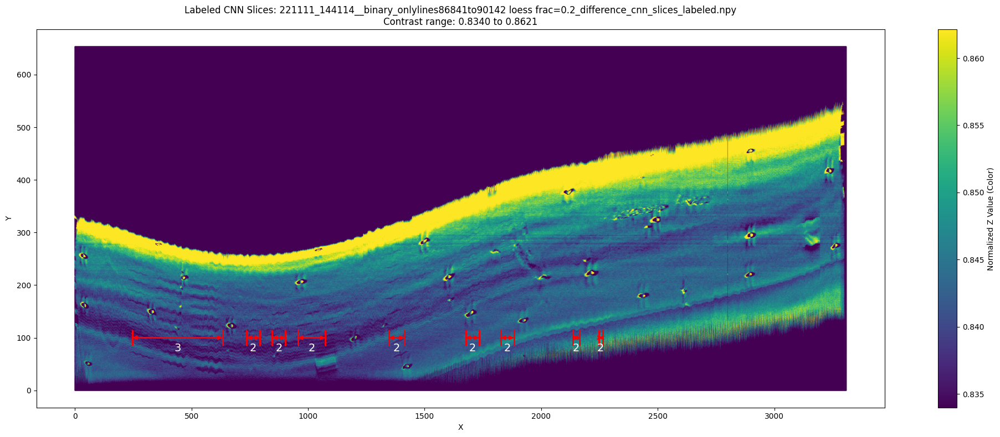

Label distribution for 221111_144114__binary_onlylines86841to90142 loess frac=0.2_difference_cnn_slices_labeled.npy:
  Label 0: 235 slices
  Label 2: 56 slices
  Label 3: 40 slices


In [7]:
# Load and render the newly created labeled CNN slices with annotations
labeled_files = [f for f in os.listdir(labeled_dir) if f.endswith("_cnn_slices_labeled.npy")]

for labeled_file in labeled_files:
    labeled_path = os.path.join(labeled_dir, labeled_file)
    data = np.load(labeled_path, allow_pickle=True).item()
    cnn_slices = data["slices"]  # shape: (num_slices, height, width)
    labels = data["labels"]  # shape: (num_slices,)
    
    slice_width = 10  # Same as used in slicing_for_cnn
    
    # Convert CNN slices back to point cloud format for visualization
    all_x = []
    all_y = []
    all_z = []
    
    for slice_idx, image in enumerate(cnn_slices):
        start_x = slice_idx * slice_width
        
        # Find non-zero pixels
        y_coords, x_coords = np.where(image != 0)
        z_values = image[y_coords, x_coords]
        
        # Convert pixel coordinates back to actual coordinates
        actual_x = x_coords + start_x
        actual_y = y_coords
        
        if len(z_values) > 0:
            all_x.extend(actual_x)
            all_y.extend(actual_y)
            all_z.extend(z_values)

    if len(all_x) > 0:
        # Calculate unique vmin/vmax for this point cloud to maximize contrast
        z_array = np.array(all_z)
        z_min = np.percentile(z_array, 5)   # Use 5th percentile to avoid extreme outliers
        z_max = np.percentile(z_array, 95)  # Use 95th percentile to avoid extreme outliers
        
        fig, ax = plt.subplots(figsize=(20, 8))  # Create both fig and ax
        sc = ax.scatter(all_x, all_y, c=all_z, s=0.1, vmin=z_min, vmax=z_max, cmap='viridis')
        ax.set_title(f"Labeled CNN Slices: {labeled_file}\nContrast range: {z_min:.4f} to {z_max:.4f}")
        ax.set_xlabel("X")
        ax.set_ylabel("Y")
        cbar = plt.colorbar(sc)
        cbar.set_label("Normalized Z Value (Color)")

        # Draw annotation lines for each label interval
        # Find annotation key
        base_name = labeled_file.replace("_cnn_slices_labeled.npy", "")
        annotation_key = None
        for key in annotations:
            if key in base_name:
                annotation_key = key
                break

        if annotation_key is not None:
            # Get Y range for proper annotation positioning
            y_min, y_max = min(all_y), max(all_y)
            for (xmin, xmax), label in annotations[annotation_key].items():
                annotation_line(ax, xmin, xmax, y=100, text=label, 
                              ytext=100-20, linecolor='red', linewidth=2, fontsize=14)

        plt.tight_layout()
        plt.show()
        
        # Print label statistics
        unique_labels, counts = np.unique(labels, return_counts=True)
        print(f"Label distribution for {labeled_file}:")
        for label, count in zip(unique_labels, counts):
            print(f"  Label {label}: {count} slices")